---
Instalation
---

In [45]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


---
Data Preprocessing
---

In [135]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, Dataset, DataLoader
from torch.autograd import Variable
import torch.utils.data

import pandas as pd
import numpy as np
import os

import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn import metrics
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA, TruncatedSVD

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
torch.cuda.empty_cache()

In [136]:
#Segment subject data
df = pd.read_csv("/content/S1_E1_A1.csv")

#drops all 0 labels (no label)
indices_to_drop = df[df["stimulus"] == 0].index
df.drop(indices_to_drop, inplace=True)

In [137]:
df.head()

,stimulus,Acc 1,Acc 2,Acc 3,EMG Channel 1,EMG Channel 2,EMG Channel 3,EMG Channel 4,EMG Channel 5,EMG Channel 6,...,Cyber Glove (angles of the joints) Sensor 13,Cyber Glove (angles of the joints) Sensor 14,Cyber Glove (angles of the joints) Sensor 15,Cyber Glove (angles of the joints) Sensor 16,Cyber Glove (angles of the joints) Sensor 17,Cyber Glove (angles of the joints) Sensor 18,Cyber Glove (angles of the joints) Sensor 19,Cyber Glove (angles of the joints) Sensor 20,Cyber Glove (angles of the joints) Sensor 21,Cyber Glove (angles of the joints) Sensor 22
767,1,-0.054199,0.74414,-0.67529,0,0,-2,-2,-1,1,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
768,1,-0.054199,0.74414,-0.67529,4,0,-2,-1,0,-1,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
769,1,-0.053853,0.74483,-0.67495,-2,-1,-1,1,-2,-2,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
770,1,-0.050781,0.75098,-0.67188,1,-1,-2,-1,-1,0,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
771,1,-0.050781,0.75098,-0.67188,-3,1,0,-2,-2,-1,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165


In [138]:
X = df.drop('stimulus', axis=1)
#y = df['stimulus']
y = df.iloc[:, 0:1]
print(X.shape, type(X), y.shape, type(y))
print()

(80601, 41) <class 'pandas.core.frame.DataFrame'> (80601, 1) <class 'pandas.core.frame.DataFrame'>



In [139]:
X.head()

,Acc 1,Acc 2,Acc 3,EMG Channel 1,EMG Channel 2,EMG Channel 3,EMG Channel 4,EMG Channel 5,EMG Channel 6,EMG Channel 7,...,Cyber Glove (angles of the joints) Sensor 13,Cyber Glove (angles of the joints) Sensor 14,Cyber Glove (angles of the joints) Sensor 15,Cyber Glove (angles of the joints) Sensor 16,Cyber Glove (angles of the joints) Sensor 17,Cyber Glove (angles of the joints) Sensor 18,Cyber Glove (angles of the joints) Sensor 19,Cyber Glove (angles of the joints) Sensor 20,Cyber Glove (angles of the joints) Sensor 21,Cyber Glove (angles of the joints) Sensor 22
767,-0.054199,0.74414,-0.67529,0,0,-2,-2,-1,1,1,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
768,-0.054199,0.74414,-0.67529,4,0,-2,-1,0,-1,-2,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
769,-0.053853,0.74483,-0.67495,-2,-1,-1,1,-2,-2,0,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
770,-0.050781,0.75098,-0.67188,1,-1,-2,-1,-1,0,-2,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165
771,-0.050781,0.75098,-0.67188,-3,1,0,-2,-2,-1,-1,...,26.486,-25.345,6.3106,34.944,19.858,0.48,15.833,64.597,9.5294,10.165


---
Visualization number of labels

stimulus
8           6795
5           6782
6           6776
7           6776
11          6773
1           6753
12          6701
10          6696
2           6656
4           6654
9           6626
3           6613
Name: count, dtype: int64

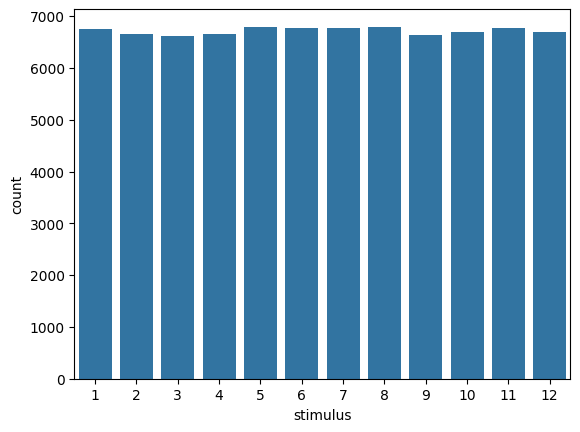

In [140]:
sns.countplot(x = 'stimulus', data=df)
y.value_counts()

---
Fixing Data Imbalance via Undersampling

<Axes: xlabel='stimulus'>

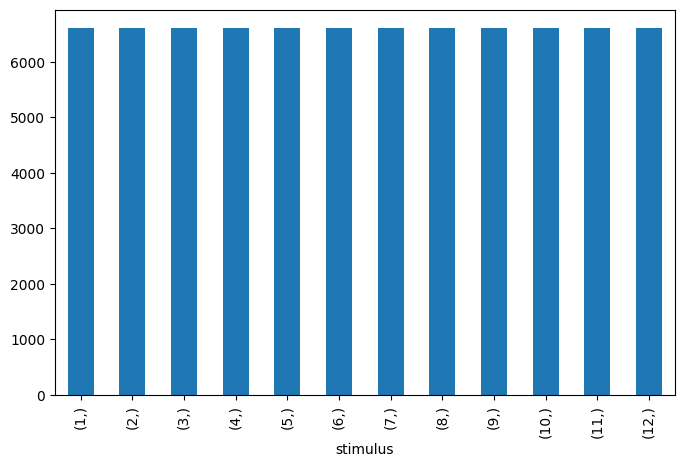

In [141]:
from imblearn.under_sampling import RandomUnderSampler

sampling_strategy = "not minority"
rus = RandomUnderSampler(sampling_strategy=sampling_strategy)
X_res, y_res = rus.fit_resample(X, y)
y_res.value_counts().plot(kind='bar', figsize=(8,5))

In [142]:
print(y_res.value_counts())
print(len(X_res.value_counts()))

stimulus
1           6613
2           6613
3           6613
4           6613
5           6613
6           6613
7           6613
8           6613
9           6613
10          6613
11          6613
12          6613
Name: count, dtype: int64
79356


In [143]:
print(y)

        stimulus
767            1
768            1
769            1
770            1
771            1
...          ...
130195        12
130196        12
130197        12
130198        12
130199        12

[80601 rows x 1 columns]


---
Train Test Split

In [144]:
X = X_res.values
y = y_res.values
print(X.shape, type(X), y.shape, type(y))
print()

# Data Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=42) # 0.25 x 0.8 = 0.2

print(f"X_train size: {len(X_train)} | X_val size: {len(X_val)} | X_test size: {len(X_test)}")
print(f"y_train size: {len(y_train)} | y_val size: {len(y_val)} | y_test size: {len(y_test)}")
print()
print(f"Training Feature Split: {X_train.shape} | Training Labels { y_train.shape}")
print(f"Validation Feature Split: {X_val.shape} | Validation Labels { y_val.shape}")
print(f"Testing Feature Split: {X_test.shape} | Testing Labels { y_test.shape}")
print()

(79356, 41) <class 'numpy.ndarray'> (79356, 1) <class 'numpy.ndarray'>

X_train size: 47613 | X_val size: 15871 | X_test size: 15872
y_train size: 47613 | y_val size: 15871 | y_test size: 15872

Training Feature Split: (47613, 41) | Training Labels (47613, 1)
Validation Feature Split: (15871, 41) | Validation Labels (15871, 1)
Testing Feature Split: (15872, 41) | Testing Labels (15872, 1)



---
Scaling/Normalizing Data

In [145]:
#Normalization Data
#----------------------------------------------------------------------------------------------------------

Standardized = preprocessing.StandardScaler()
X_train_Normalized= Standardized.fit_transform(X_train)
X_val_Normalized = Standardized.transform(X_val)
X_test_Normalized = Standardized.transform(X_test)


X_train = torch.from_numpy(X_train_Normalized).float()
y_train = torch.from_numpy(y_train).long()

X_val = torch.from_numpy(X_val_Normalized).float()
y_val = torch.from_numpy(y_val).long()

X_test = torch.from_numpy(X_test_Normalized).float()
y_test = torch.from_numpy(y_test).long()

print(f"X_train: {type(X_train)} | y_train {type(y_train)}")
print(f"X_val: {type(X_val)} | y_train {type(y_val)}")
print(f"X_test: {type(X_test)} | y_test {type(y_test)}")
print()
print(f"Training: {X_train.shape} , { y_train.shape}")
print(f"Validation: {X_val.shape} , { y_val.shape}")
print(f"Testing:  {X_test.shape} , { y_test.shape}")

X_train: <class 'torch.Tensor'> | y_train <class 'torch.Tensor'>
X_val: <class 'torch.Tensor'> | y_train <class 'torch.Tensor'>
X_test: <class 'torch.Tensor'> | y_test <class 'torch.Tensor'>

Training: torch.Size([47613, 41]) , torch.Size([47613, 1])
Validation: torch.Size([15871, 41]) , torch.Size([15871, 1])
Testing:  torch.Size([15872, 41]) , torch.Size([15872, 1])


---


In [146]:
#############################################################################################################################################################################################################

#Hyperparameters
latent_dim = 2

input_dim= 41
hidden_dim= round(input_dim/2)
hidden_dim_2 = round(input_dim/4)
num_classes = 12
num_layers = round(num_classes/2)

num_epochs= 30
lr= 0.006
batch_size= 100

alpha= 1
beta=  1
gamma= 1
delta= 1


---
Defining Dataloaders


In [147]:
class ClassifierDataset(Dataset):
    def __init__(self, X_data, y_data):
        self.X_data = X_data
        self.y_data = y_data

    def __getitem__(self, index):
        return self.X_data[index], self.y_data[index]

    def __len__ (self):
        return len(self.X_data)

In [148]:
training = ClassifierDataset(X_train, y_train)
validating = ClassifierDataset(X_val, y_val)
testing = ClassifierDataset(X_test, y_test)


train_loader = DataLoader(training, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(validating, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(testing, batch_size=batch_size, shuffle=False)

def get_data_loader(optuna_batch_size):
  train_loader = DataLoader(training, batch_size=optuna_batch_size, shuffle=True)
  val_loader = DataLoader(validating, batch_size=optuna_batch_size, shuffle=False)
  test_loader = DataLoader(testing, batch_size=optuna_batch_size, shuffle=False)
  return train_loader, val_loader, test_loader

---
Training and Validation
---

In [149]:
class VAE(nn.Module):
  def __init__(self, input_dim, hidden_dim, latent_dim):
    super(VAE,self).__init__()
    self.encoder = nn.Sequential(
        nn.Linear(input_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim_2),
        nn.ReLU(),
        nn.Linear(hidden_dim_2, hidden_dim_2),
    )
    self.mu = nn.Linear(hidden_dim_2, latent_dim)   # mu
    self.logvar = nn.Linear(hidden_dim_2, latent_dim)   # log-var
    self.decoder = nn.Sequential(
        nn.Linear(latent_dim, hidden_dim_2),
        nn.ReLU(),
        nn.Linear(hidden_dim_2, hidden_dim_2),
        nn.ReLU(),
        nn.Linear(hidden_dim_2, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, hidden_dim),
        nn.ReLU(),
        nn.Linear(hidden_dim, input_dim),
    )
    self.classifier = nn.Sequential(
        nn.Linear(latent_dim, num_layers),
        nn.Tanh(),
        nn.Linear(num_layers, 12),
        nn.Softmax(dim=1)
    )

  def encode(self, x):
    z = self.encoder(x)
    z1 = self.mu(z)
    z2 = self.logvar(z)
    return z1, z2                 # (mu, log-var)

  def decode(self, x):

    return self.decoder(x)

  def forward(self, x):
#  Reparamaterize
    mu, logvar = self.encode(x)
    stdev = torch.exp(0.5 * logvar)
    esp = torch.randn_like(stdev)
    z_reparmeterized = mu + (esp * stdev)

    x_reconstructed = self.decode(z_reparmeterized)
    classified = self.classifier(z_reparmeterized)

    return (x_reconstructed, z_reparmeterized, classified, mu, logvar)

if __name__ == "__main__":
  x = torch.rand(batch_size,input_dim)
  vae = VAE(input_dim, hidden_dim, latent_dim)
  x_reconstructed, z_reparmeterized, classified, mu, logvar = vae(x)
  print(f"Reconstruction X: {x_reconstructed.shape}")

  print(f"Mu: {mu.shape} ")

  print(f"Logvar: {logvar.shape}")

  print(f"Latent Space Z: {z_reparmeterized.shape}")

  print(f"Classifier: {classified.shape}")

Reconstruction X: torch.Size([100, 41])
Mu: torch.Size([100, 2]) 
Logvar: torch.Size([100, 2])
Latent Space Z: torch.Size([100, 2])
Classifier: torch.Size([100, 12])


In [150]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, mu, labels):
        # Compute the pairwise euclidean distances between the examples in the latent space
        distances = torch.pow(mu, 2).sum(dim=1, keepdim=True) + torch.pow(mu, 2).sum(dim=1, keepdim=True).t() - 2 * torch.matmul(mu, mu.t())
        # Create a mask for the positive pairs (i.e. examples with the same label)
        positive_mask = labels.expand(mu.size(0), mu.size(0)).eq(labels.expand(mu.size(0), mu.size(0)).t())
        # Create a mask for the negative pairs (i.e. examples with different labels)
        negative_mask = labels.expand(mu.size(0), mu.size(0)).ne(labels.expand(mu.size(0), mu.size(0)).t())

        # Compute the contrastive loss for both positive and negative pairs
        negative_loss = torch.sum(torch.max(torch.zeros_like(distances), self.margin - distances) * negative_mask.float())
        positive_loss = torch.sum(distances * positive_mask.float())

        # Combine the positive and negative losses
        contrastive_loss =  negative_loss + positive_loss

        return contrastive_loss


In [151]:
# Loss Functions
loss_fn = nn.MSELoss(reduction="sum")
classifier_loss_fn = nn.CrossEntropyLoss()
contrastive_loss_fn = ContrastiveLoss(margin=1)

train_loader = DataLoader(training, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(validating, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(testing, batch_size=batch_size, shuffle=False)

# #Model and Optmimizer
model  = VAE(input_dim, hidden_dim, latent_dim).to(device)
optimizer = optim.Adam(model.parameters(), lr=lr)
print(model)

VAE(
  (encoder): Sequential(
    (0): Linear(in_features=41, out_features=20, bias=True)
    (1): ReLU()
    (2): Linear(in_features=20, out_features=20, bias=True)
    (3): ReLU()
    (4): Linear(in_features=20, out_features=10, bias=True)
    (5): ReLU()
    (6): Linear(in_features=10, out_features=10, bias=True)
  )
  (mu): Linear(in_features=10, out_features=2, bias=True)
  (logvar): Linear(in_features=10, out_features=2, bias=True)
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=10, bias=True)
    (1): ReLU()
    (2): Linear(in_features=10, out_features=10, bias=True)
    (3): ReLU()
    (4): Linear(in_features=10, out_features=20, bias=True)
    (5): ReLU()
    (6): Linear(in_features=20, out_features=20, bias=True)
    (7): ReLU()
    (8): Linear(in_features=20, out_features=41, bias=True)
  )
  (classifier): Sequential(
    (0): Linear(in_features=2, out_features=6, bias=True)
    (1): Tanh()
    (2): Linear(in_features=6, out_features=12, bias=True)
    (

---
Train and Validation loop

In [152]:
  train_losses=[]
  train_accuracy = []

  accuracy_log = []
  val_losses=[]
  val_accuracy=[]

  train_acces = []
  val_acces = []

  dic = dict(latent_space = list(), mu_list=list(), logsig2_list=list(), y=list())

  for epoch in range(num_epochs):
    model.train()
    train_running_loss = 0


    z_list, means, logvars , labels_list = list(), list(), list(), list()

    for i, data in enumerate(train_loader):
      inputs, labels = data
      # print(f"Input shape: {inputs.shape}")
      #print(f"Labels shape: {labels.shape}")
      optimizer.zero_grad()

      x_reconstructed, z_reparmeterized, classified, mu, logvar = model(inputs)

      # Compute the reconstruction loss and KL divergence loss #################################################

      reconstruction_loss = loss_fn(x_reconstructed, inputs)
      kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

      # Compute the contrastive loss #############################################################################
      contrastive_loss = contrastive_loss_fn(mu, labels)

      # Compute the classificaiton loss #########################################################################
      classified = classified.view(-1, 12)
      labels = labels - 1
      #print(f"Labels shape: {labels.shape}")
      classification_loss = classifier_loss_fn(classified, labels.flatten())

      #print(classified.shape)

      loss = (alpha*reconstruction_loss + kld_loss*beta) + gamma*classification_loss + delta*contrastive_loss #+ epsilon*triplet_loss

      accuracy = accuracy_score(labels, classified.argmax(dim=1))
      train_accuracy.append(accuracy)
      train_acc = sum(train_accuracy)/len(train_accuracy)
      accuracy_log.append(train_acc)

      loss.backward()
      optimizer.step()

      train_running_loss += loss.item()
      train_loss= train_running_loss/len(train_loader)

    # log for latent space visualziation (gif)...
      z_list.append(z_reparmeterized.detach())
      means.append(mu.detach())
      logvars.append(logvar.detach())
      labels_list.append(labels.detach())

    with torch.inference_mode():
      val_running_loss = 0
      val_running_acc = 0

      model.eval()
      # Iterate over the validation data
      for X, Y in val_loader:
        # Pass the data through the model and get the reconstructed data and the latent representation
        y_pred, z_reparmeterized, v_classified, mu, logvar = model(X)

        # Compute the reconstruction loss
        v_reconstruction_loss = loss_fn(y_pred, X)

        # Compute the KL divergence loss
        v_kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        # Compute the contrastive loss
        v_contrastive_loss_value = contrastive_loss_fn(mu, Y)

        # Reshape the classified output to have the same shape as the labels
        v_classified = v_classified.view(-1, 12)
        # Compute the classification
        Y= Y-1
        v_classification_loss = classifier_loss_fn(v_classified, Y.flatten())

        # Compute the total loss
        vloss = (alpha*v_reconstruction_loss + v_kld_loss*beta) + gamma*v_classification_loss + delta*v_contrastive_loss_value
        val_running_loss += vloss.item()
        val_loss = val_running_loss/len(val_loader)

        v_accuracy = accuracy_score(Y, v_classified.argmax(dim=1))
        val_accuracy.append(v_accuracy)
        val_acc = sum(val_accuracy)/len(val_accuracy)

    dic['latent_space'].append(torch.cat(z_list))
    dic['mu_list'].append(torch.cat(means))
    dic['logsig2_list'].append(torch.cat(logvars))
    dic['y'].append(torch.cat(labels_list))

    print(f"Epoch: {epoch+1} / {num_epochs} | Reconst_loss: {reconstruction_loss:.3f} | Kldiv loss: {kld_loss:.3f} | Classifcation loss: {classification_loss:.3f} | Constrast loss: {contrastive_loss:.2f} | Total loss: {train_loss:.3f} | Train acc: {train_acc*100:.3f} % ||| Val Loss: {val_loss:.3f} | Val acc: {val_acc*100:.3f} %")
    print("-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------")
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_acces.append(train_acc)
    val_acces.append(val_acc)

Epoch: 1 / 30 | Reconst_loss: 496.073 | Kldiv loss: 33.762 | Classifcation loss: 2.237 | Constrast loss: 6.49 | Total loss: 4998.495 | Train acc: 33.091 % ||| Val Loss: 3966.340 | Val acc: 48.480 %
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch: 2 / 30 | Reconst_loss: 353.839 | Kldiv loss: 47.131 | Classifcation loss: 1.999 | Constrast loss: 4.87 | Total loss: 3454.693 | Train acc: 47.385 % ||| Val Loss: 3275.947 | Val acc: 63.373 %
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Epoch: 3 / 30 | Reconst_loss: 315.583 | Kldiv loss: 52.306 | Classifcation loss: 1.751 | Constrast loss: 5.77 | Total loss: 3118.320 | Train acc: 59.231 % ||| Val Loss: 3040.386 | Val acc: 70.679 %
------

---
Model Evaluations

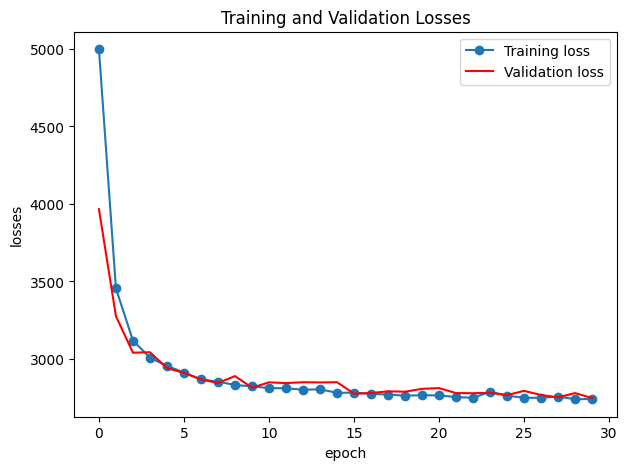

In [153]:
fig = plt.figure(figsize=(7,5))
plt.plot(train_losses,'-o', label="Training loss")
plt.plot(val_losses,'-r',  label="Validation loss")
plt.xlabel('epoch')
plt.ylabel('losses')
plt.title('Training and Validation Losses')
plt.legend()
plt.show()

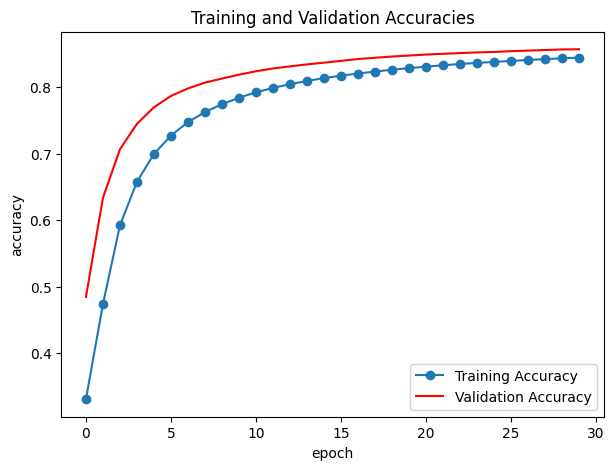

In [154]:
fig = plt.figure(figsize=(7,5))
plt.plot(train_acces,'-o', label="Training Accuracy")
plt.plot(val_acces,'-r',  label="Validation Accuracy")
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.title('Training and Validation Accuracies')
plt.legend()
plt.show()

---
Latent Space Visualization

Latent Space Visualization


<ipython-input-155-3e4307de1aee>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(z_arr[:, 0], z_arr[:, 1], c=y_arr, edgecolor='none', alpha=0.5, cmap=plt.cm.get_cmap('gist_rainbow', num_classes), vmin=1, vmax=12)


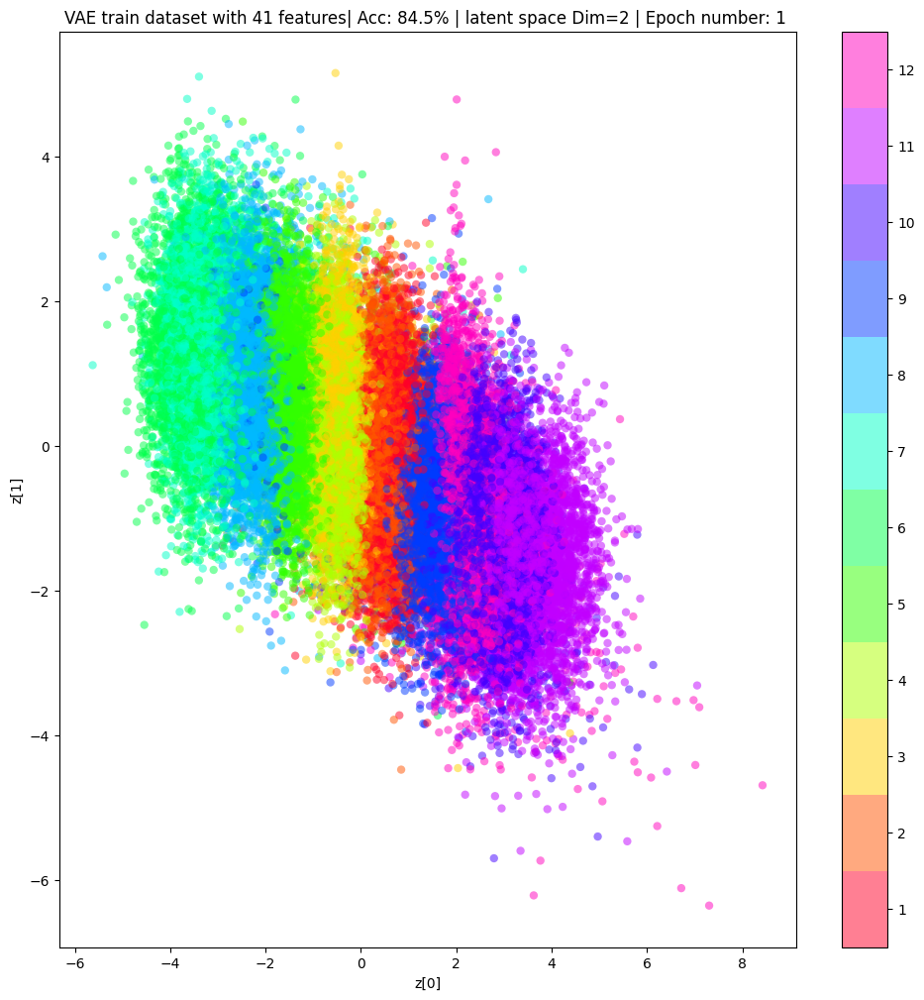

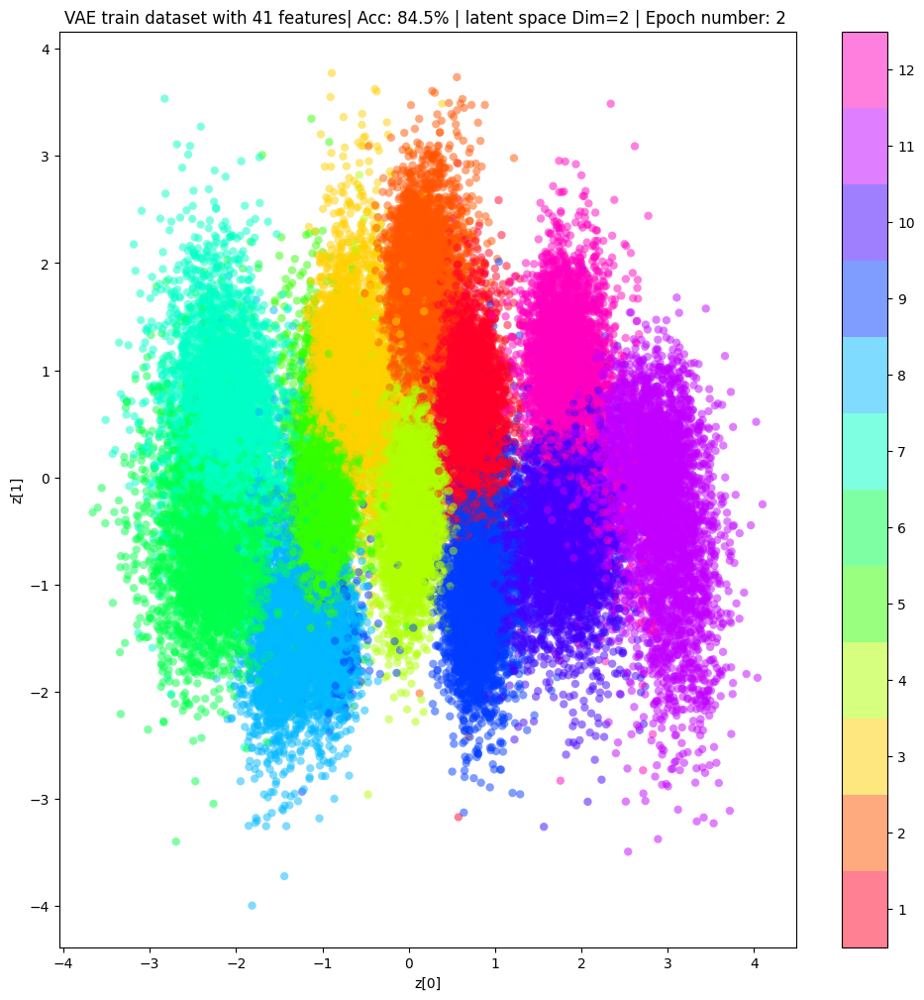

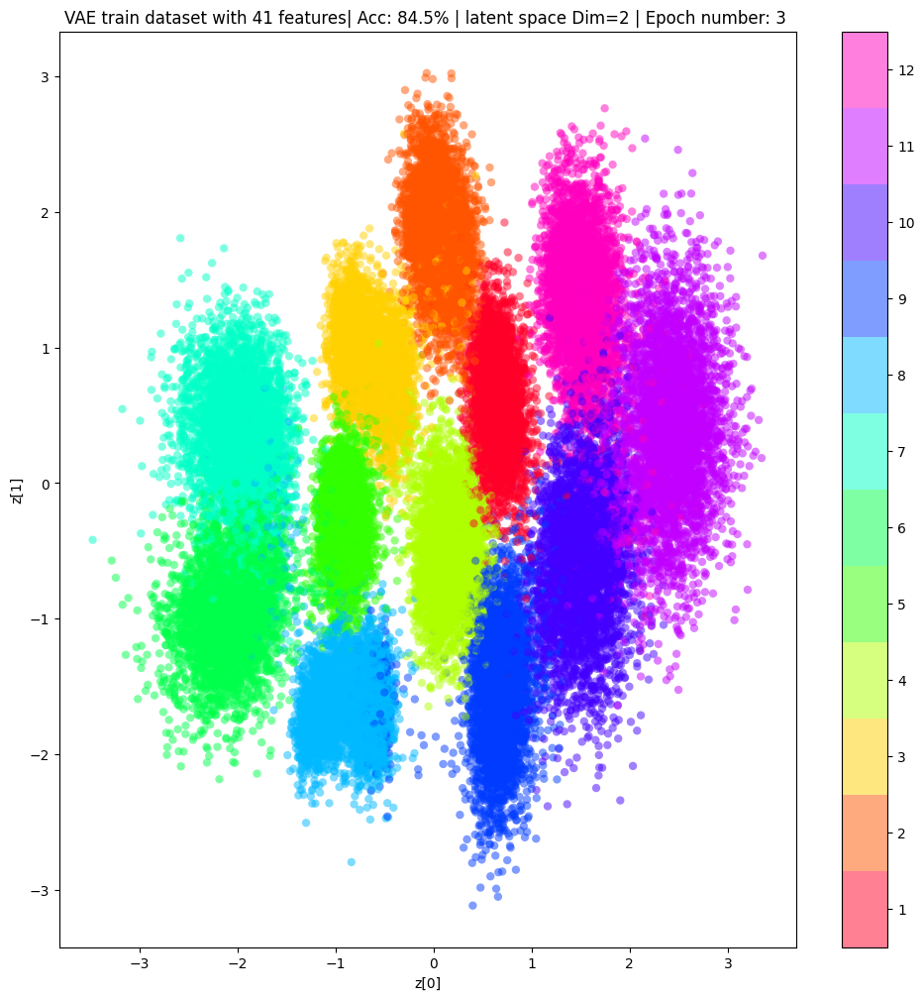

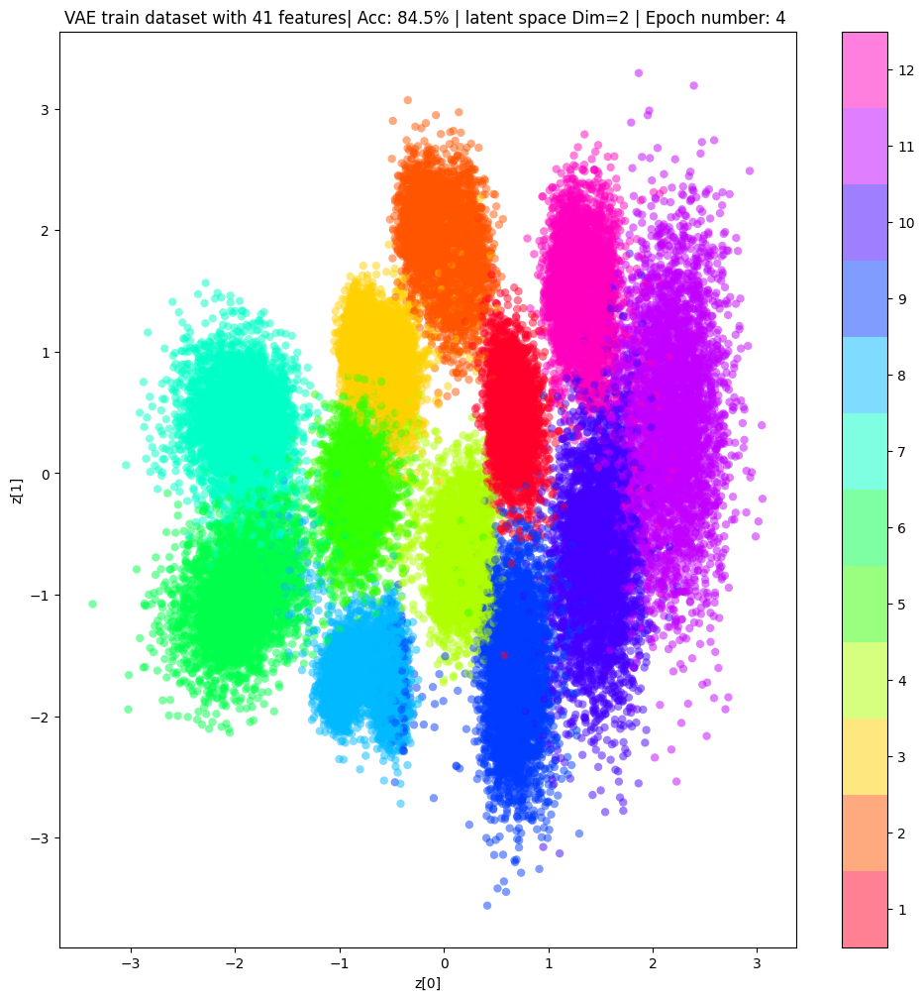

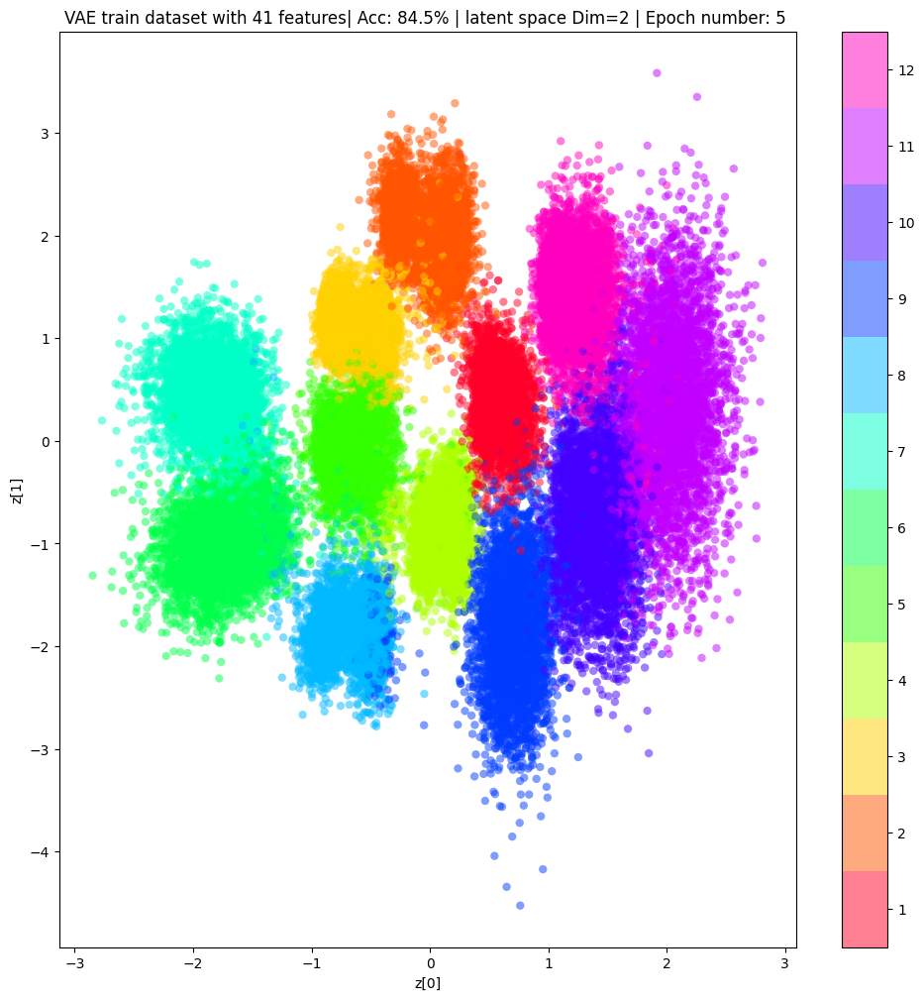

...

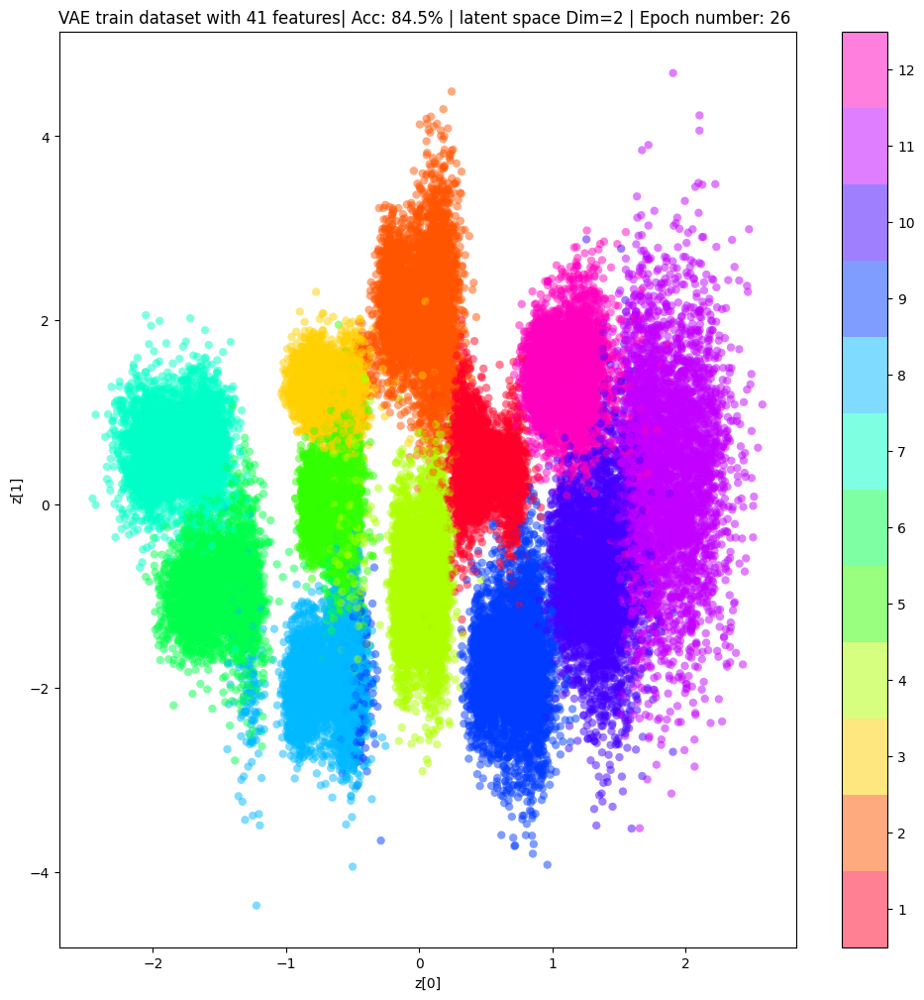

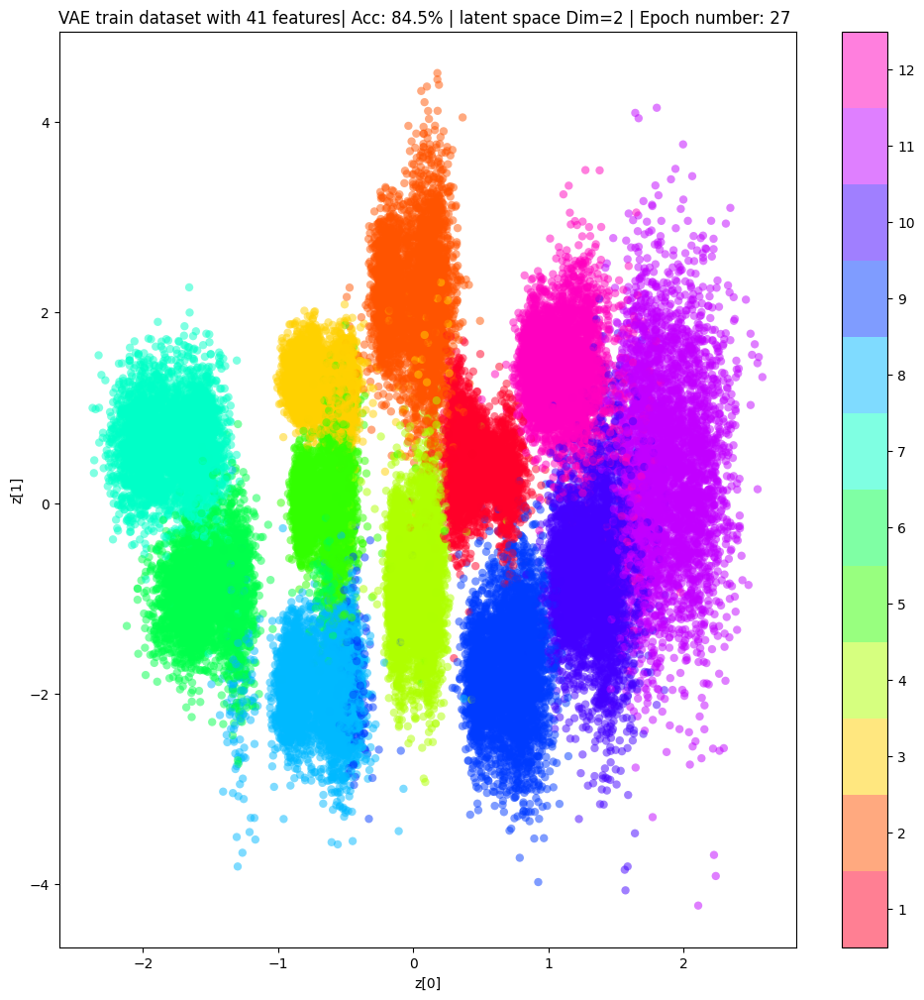

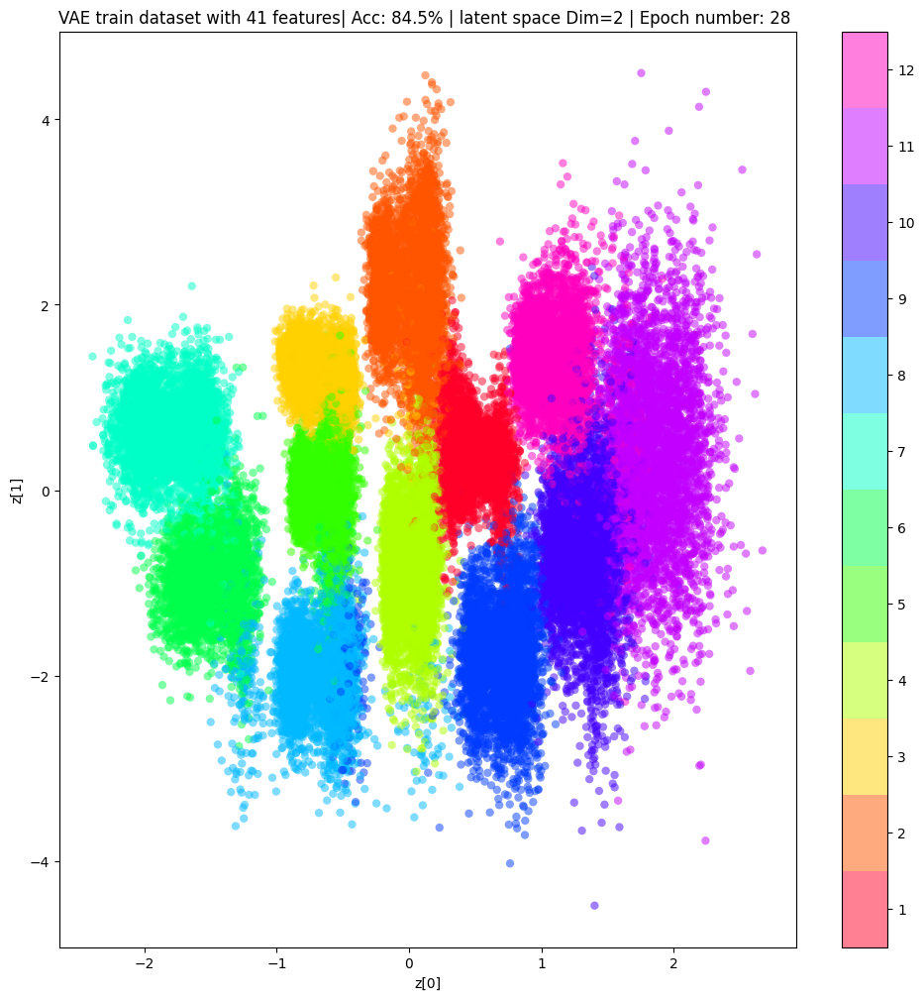

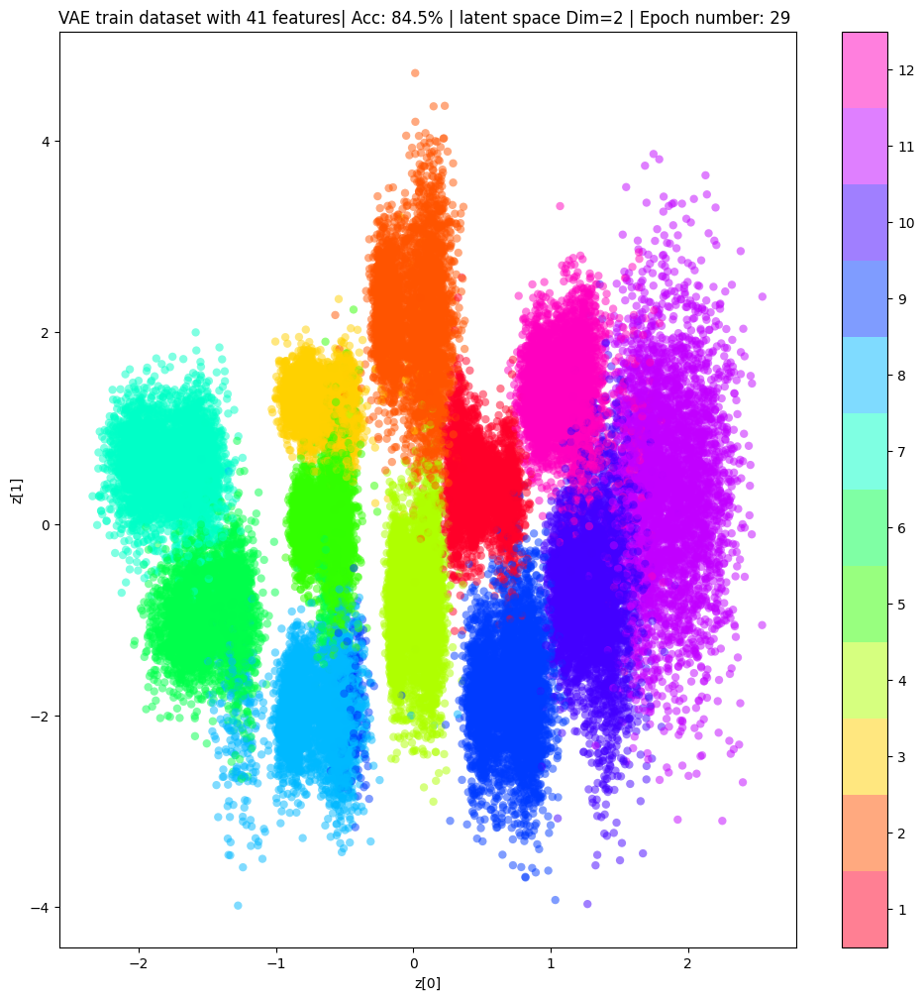

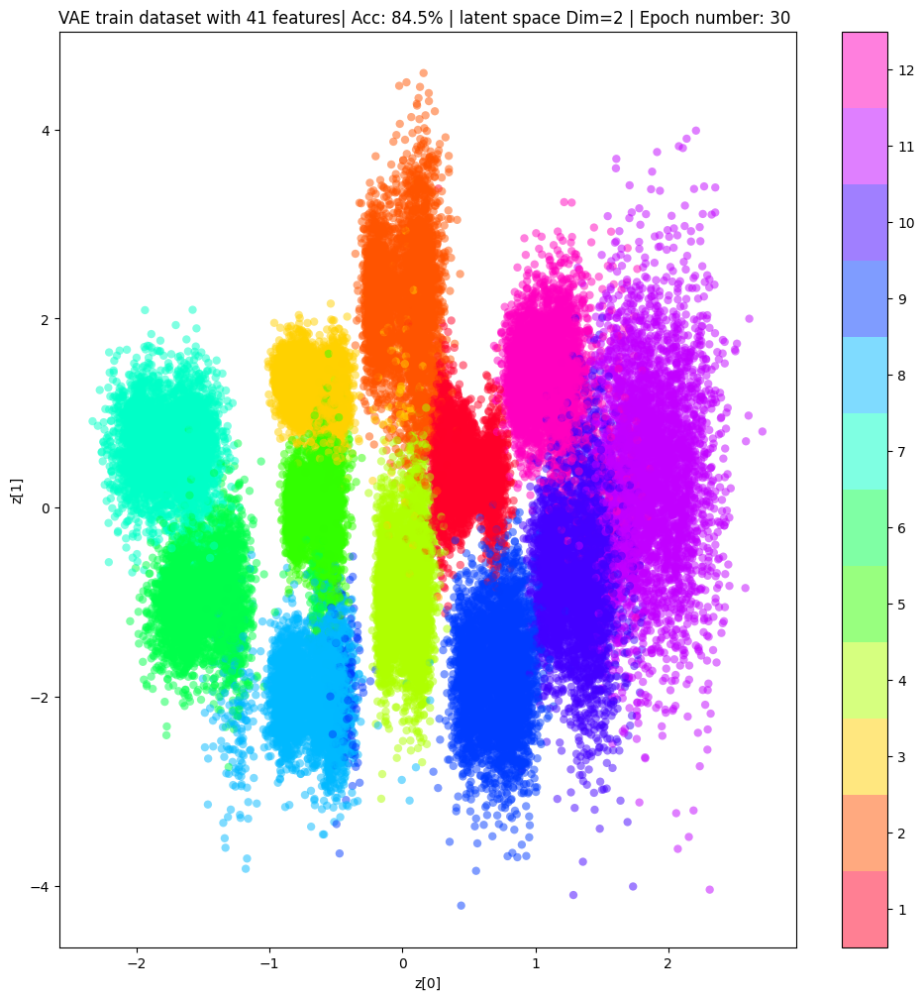

In [155]:
print("Latent Space Visualization")
for i in range(num_epochs):
  fig = plt.figure(figsize=(12, 12))
  z_arr = dic['latent_space'][i].cpu().numpy()
  y_arr = dic['y'][i].cpu().numpy()
  y_arr = y_arr + 1

  plt.scatter(z_arr[:, 0], z_arr[:, 1], c=y_arr, edgecolor='none', alpha=0.5, cmap=plt.cm.get_cmap('gist_rainbow', num_classes), vmin=1, vmax=12)
  cb = plt.colorbar(ticks=range(1, 13), values=range(1, 13))
  cb.ax.tick_params(labelsize=10)
  plt.xticks(fontsize=10)
  plt.yticks(fontsize=10)
  plt.xlabel('z[0]', fontsize=10)
  plt.ylabel('z[1]', fontsize=10)
  plt.title(f'VAE train dataset with {input_dim} features| Acc: {train_acc*100:.1f}% | latent space Dim={latent_dim} | Epoch number: {i+1} ', fontsize= 12)
  plt.show()
  plt.close()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

              precision    recall  f1-score   support

           1       0.96      0.95      0.96      1296
           2       0.92      0.96      0.94      1306
           3       0.00      0.00      0.00      1286
           4       0.95      0.98      0.97      1326
           5       0.58      0.97      0.72      1335
           6       0.94      0.94      0.94      1408
           7       0.80      0.95      0.87      1301
           8       0.92      0.97      0.95      1300
           9       0.94      0.94      0.94      1393
          10       0.87      0.90      0.89      1368
          11       0.92      0.90      0.91      1249
          12       0.95      0.93      0.94      1304

    accuracy                           0.87     15872
   macro avg       0.81      0.87      0.84     15872
weighted avg       0.82      0.87      0.84     15872



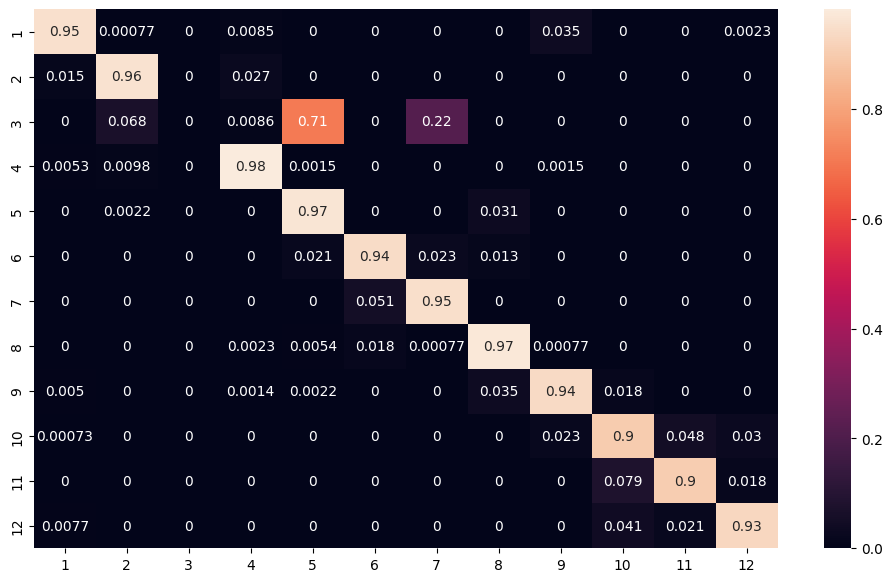

In [156]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

y_pred = []
y_true = []

# iterate over test data
for inputs, labels in test_loader:
  x_reconstructed, z_reparmeterized, classified, mu, logvar = model(inputs)
  classified = (torch.max(torch.exp(classified), 1)[1]).data.cpu().numpy()
  y_pred.extend(classified) # Save Prediction

  labels = labels-1

  labels = labels.data.cpu().numpy()
  y_true.extend(labels) # Save Truth

# constant for classes
classes = ('1', '2', '3', '4', '5','6', '7', '8', '9', '10','11','12',)

# Build confusion matrix
cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [i for i in classes],
                     columns = [i for i in classes])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm, annot=True)

from sklearn import metrics
from sklearn.metrics import classification_report
label_names = ['1', '2', '3', '4','5','6','7','8','9','10','11','12']

print(classification_report(y_true, y_pred,target_names=label_names))

report = classification_report(y_true, y_pred,target_names=label_names,output_dict=True)

df_report = pd.DataFrame(report).T
#df_report.head()